In [161]:

from sklearn import preprocessing
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas.plotting import scatter_matrix
import time 
from datetime import datetime
import copy
import random
from sklearn.model_selection import train_test_split
import seaborn as sns; sns.set_theme()
import bnlearn as bn

In [162]:
data = pd.read_csv( r"C:\Users\Amelia\OneDrive\Documents\Y3 Chem Eng\ML\group cw\epl-training.csv",index_col=0)
data = data.dropna(axis=1, how='all')

data.head()

In [163]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4560 entries, 16/08/08 to 26/07/2020
Data columns (total 24 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   HomeTeam     4560 non-null   object 
 1   AwayTeam     4560 non-null   object 
 2   FTHG         4560 non-null   int64  
 3   FTAG         4560 non-null   int64  
 4   FTR          4560 non-null   object 
 5   HTHG         4560 non-null   int64  
 6   HTAG         4560 non-null   int64  
 7   HTR          4560 non-null   object 
 8   Referee      4560 non-null   object 
 9   HS           4560 non-null   int64  
 10  AS           4560 non-null   int64  
 11  HST          4560 non-null   int64  
 12  AST          4560 non-null   int64  
 13  HF           4560 non-null   int64  
 14  AF           4560 non-null   int64  
 15  HC           4560 non-null   int64  
 16  AC           4560 non-null   int64  
 17  HY           4560 non-null   int64  
 18  AY           4560 non-null   int64  
 19

In [164]:
# dont know what is the point of column 70,71,72 yet. 
# As most of the values of them are null and not named & explanied
# For now assume they are meaningless and delete
data.loc[data['Unnamed: 70'].notnull()]

,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,Referee,HS,...,AF,HC,AC,HY,AY,HR,AR,Unnamed: 70,Unnamed: 71,Unnamed: 72
Date,,,,,,,,,,,,,,,,,,,,,
18/08/12,Arsenal,Sunderland,0,0,D,0,0,D,C Foy,14,...,8,7,0,0,0,0,0,1.44,4.72,8.71
18/08/12,Fulham,Norwich,5,0,H,2,0,H,M Oliver,11,...,11,6,3,0,0,0,0,1.84,3.75,4.75
18/08/12,Newcastle,Tottenham,2,1,H,0,0,D,M Atkinson,6,...,8,3,5,2,2,0,0,2.83,3.35,2.72
18/08/12,QPR,Swansea,0,5,A,0,1,A,L Probert,20,...,14,5,3,2,2,0,0,2.00,3.53,4.15
18/08/12,Reading,Stoke,1,1,D,0,1,A,K Friend,9,...,14,4,3,2,4,0,1,2.47,3.30,3.22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19/05/13,Swansea,Fulham,0,3,A,0,1,A,L Mason,19,...,9,8,0,2,1,0,0,1.66,4.09,5.76
19/05/13,Tottenham,Sunderland,1,0,H,0,0,D,A Marriner,23,...,12,14,1,1,3,0,1,1.25,6.60,15.00
19/05/13,West Brom,Man United,5,5,D,1,3,A,M Oliver,15,...,6,3,5,0,1,0,0,3.65,3.42,2.17


In [165]:
del data['Unnamed: 70']
del data['Unnamed: 71']
del data['Unnamed: 72']

In [166]:
data.isnull().values.any()

False

In [167]:
# Think about how to use referee as prior
data['Referee'].value_counts().head(10) 

M Dean           349
M Atkinson       336
A Marriner       298
M Oliver         266
A Taylor         258
L Mason          253
K Friend         229
J Moss           225
M Clattenburg    207
M Jones          202
Name: Referee, dtype: int64

In [168]:
#some team play more often
data['HomeTeam'].value_counts()

Man City            228
Tottenham           228
Arsenal             228
Everton             228
Man United          228
Chelsea             228
Liverpool           228
West Ham            209
Stoke               190
Newcastle           190
Aston Villa         171
Sunderland          171
West Brom           171
Southampton         152
Fulham              133
Swansea             133
Crystal Palace      133
Burnley             114
Leicester           114
Bournemouth          95
Norwich              95
Wolves               95
Hull                 95
Watford              95
Wigan                95
Blackburn            76
Bolton               76
Brighton             57
QPR                  57
Middlesbrough        38
Birmingham           38
Cardiff              38
Huddersfield         38
Portsmouth           38
Sheffield United     19
Reading              19
Blackpool            19
Name: HomeTeam, dtype: int64

In [169]:
# Total team number
hometeam = data['HomeTeam'].unique()
hometeam.size

37

In [170]:
data.index= pd.to_datetime(data.index)
data = data.sort_index()
data

,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,Referee,HS,...,HST,AST,HF,AF,HC,AC,HY,AY,HR,AR
Date,,,,,,,,,,,,,,,,,,,,,
2008-01-11,Chelsea,Sunderland,5,0,H,3,0,H,M Atkinson,17,...,11,0,5,11,4,0,0,1,0,0
2008-01-11,Everton,Fulham,1,0,H,0,0,D,L Mason,9,...,4,5,11,15,6,5,0,0,0,0
2008-01-11,Man United,Hull,4,3,H,3,1,H,M Dean,20,...,11,7,12,13,9,1,2,2,0,0
2008-01-11,Middlesbrough,West Ham,1,1,D,0,1,A,A Marriner,11,...,7,8,10,14,5,4,3,4,0,0
2008-01-11,Portsmouth,Wigan,1,2,A,0,1,A,P Walton,16,...,8,8,9,11,9,6,0,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-01,Aston Villa,Man City,1,6,A,0,4,A,J Moss,7,...,1,12,5,12,2,4,2,1,0,0
2020-12-07,Aston Villa,Crystal Palace,2,0,H,1,0,H,M Atkinson,12,...,9,5,21,21,5,1,2,4,0,1
2020-12-07,Bournemouth,Leicester,4,1,H,0,1,A,S Attwell,10,...,4,5,11,12,2,6,2,1,0,1


### Baseline

In [171]:
#accuracy of prediction 'all home team will win'
data['FTR'].value_counts()['H']/data.shape[0]

0.4611842105263158

In [172]:
#accuracy of prediction 'all away team will win'
data['FTR'].value_counts()['A']/data.shape[0]

0.2912280701754386

### Data preparation
#### Firstly, we simplify the problem to predicting the possibility of home team winning-a binary classification

In [173]:
def home_win(result):
    return result =='H' and 1 or 0

In [174]:
team_history= data[['HomeTeam', 'AwayTeam', 'FTR','FTHG','FTAG']].copy()
team_history['FTR']= team_history['FTR'].apply(home_win)

In [175]:
team_history

,HomeTeam,AwayTeam,FTR,FTHG,FTAG
Date,,,,,
2008-01-11,Chelsea,Sunderland,1,5,0
2008-01-11,Everton,Fulham,1,1,0
2008-01-11,Man United,Hull,1,4,3
2008-01-11,Middlesbrough,West Ham,0,1,1
2008-01-11,Portsmouth,Wigan,0,1,2
...,...,...,...,...,...
2020-12-01,Aston Villa,Man City,0,1,6
2020-12-07,Aston Villa,Crystal Palace,1,2,0
2020-12-07,Bournemouth,Leicester,1,4,1


In [176]:
#'VG'-valid full time goal (home - away or away - home) per period of time
team_history['HVG'] = np.nan
team_history['AVG'] = np.nan
team_history['HHVG'] = np.nan
team_history['HAVG'] = np.nan

In [177]:
FULLTIME = 0
HALFTIME = 1
def valid_goals_per_period(df,period,time_len):
    hometeam = data['HomeTeam'].unique()
    teams_goals = pd.DataFrame(index=df.index.values, columns=hometeam)
    if time_len==FULLTIME:
        hg = 'FTHG'
        ag = 'FTAG'
    elif time_len==HALFTIME:
        hg = 'HTHG'
        ag = 'HTAG'
    else:
        raise Exception("Sorry, time lenth should be FULLTIME or HALFTIME")
    r = len(df)%period    
      
    for i in range(len(df)):
        
        teams_goals[df.iloc[i]['HomeTeam'] ][i] = df.iloc[i][hg] - df.iloc[i][ag]
        teams_goals[df.iloc[i]['AwayTeam']][i] = df.iloc[i][ag] - df.iloc[i][hg]
    
    teams_goals=teams_goals.fillna(0)
    
    for i in range (len(teams_goals)):
        if i%period!=0: 
            teams_goals.iloc[i] += teams_goals.iloc[i-1]

    return teams_goals

#'VG'-valid goal per period of time
def get_valid_full_goals(df,goalcount_df,time_len):
    if time_len==FULLTIME:
        hg = 'HVG'
        ag = 'AVG'
    elif time_len==HALFTIME:
        hg = 'HHVG'
        ag = 'HAVG'
    else:
        raise Exception("Sorry, time lenth should be FULLTIME or HALFTIME")
    for i in range(len(df)):
        df[hg].iloc[i]=goalcount_df[df['HomeTeam'].iloc[i]].iloc[i]
        df[ag].iloc[i]=goalcount_df[df['AwayTeam'].iloc[i]].iloc[i]

In [178]:
full_time_goal_count=valid_goals_per_period(data,100,FULLTIME)
half_time_goal_count=valid_goals_per_period(data,100,HALFTIME)
get_valid_full_goals(team_history,full_time_goal_count,FULLTIME)
get_valid_full_goals(team_history,half_time_goal_count,HALFTIME)

In [179]:
#rate of shots on target by home and away team
team_history['HTSR'] = data['HST']/data['HS']
team_history['ATSR'] = data['AST']/data['AS']
team_history

,HomeTeam,AwayTeam,FTR,FTHG,FTAG,HVG,AVG,HHVG,HAVG,HTSR,ATSR
Date,,,,,,,,,,,
2008-01-11,Chelsea,Sunderland,1,5,0,5.0,-5.0,3.0,-3.0,0.647059,0.000000
2008-01-11,Everton,Fulham,1,1,0,1.0,-1.0,0.0,0.0,0.444444,0.333333
2008-01-11,Man United,Hull,1,4,3,1.0,-1.0,2.0,-2.0,0.550000,0.636364
2008-01-11,Middlesbrough,West Ham,0,1,1,0.0,0.0,-1.0,1.0,0.636364,0.615385
2008-01-11,Portsmouth,Wigan,0,1,2,-1.0,1.0,-1.0,1.0,0.500000,0.666667
...,...,...,...,...,...,...,...,...,...,...,...
2020-12-01,Aston Villa,Man City,0,1,6,-11.0,23.0,-6.0,13.0,0.142857,0.545455
2020-12-07,Aston Villa,Crystal Palace,1,2,0,-9.0,-8.0,-5.0,-6.0,0.750000,0.555556
2020-12-07,Bournemouth,Leicester,1,4,1,-2.0,-3.0,-4.0,0.0,0.400000,0.384615


In [180]:
#rate of on opposition target shots defended by team
team_history['HTDR'] = data['FTAG']/data['AST']
team_history['ATDR'] = data['FTHG']/data['HST']

team_history

,HomeTeam,AwayTeam,FTR,FTHG,FTAG,HVG,AVG,HHVG,HAVG,HTSR,ATSR,HTDR,ATDR
Date,,,,,,,,,,,,,
2008-01-11,Chelsea,Sunderland,1,5,0,5.0,-5.0,3.0,-3.0,0.647059,0.000000,NaN,0.454545
2008-01-11,Everton,Fulham,1,1,0,1.0,-1.0,0.0,0.0,0.444444,0.333333,0.000000,0.250000
2008-01-11,Man United,Hull,1,4,3,1.0,-1.0,2.0,-2.0,0.550000,0.636364,0.428571,0.363636
2008-01-11,Middlesbrough,West Ham,0,1,1,0.0,0.0,-1.0,1.0,0.636364,0.615385,0.125000,0.142857
2008-01-11,Portsmouth,Wigan,0,1,2,-1.0,1.0,-1.0,1.0,0.500000,0.666667,0.250000,0.125000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-01,Aston Villa,Man City,0,1,6,-11.0,23.0,-6.0,13.0,0.142857,0.545455,0.500000,1.000000
2020-12-07,Aston Villa,Crystal Palace,1,2,0,-9.0,-8.0,-5.0,-6.0,0.750000,0.555556,0.000000,0.222222
2020-12-07,Bournemouth,Leicester,1,4,1,-2.0,-3.0,-4.0,0.0,0.400000,0.384615,0.200000,1.000000


In [181]:
#Dealing with missing values where teams got no target shots
team_history.fillna(team_history.mean(), inplace=True)

team_history


,HomeTeam,AwayTeam,FTR,FTHG,FTAG,HVG,AVG,HHVG,HAVG,HTSR,ATSR,HTDR,ATDR
Date,,,,,,,,,,,,,
2008-01-11,Chelsea,Sunderland,1,5,0,5.0,-5.0,3.0,-3.0,0.647059,0.000000,inf,0.454545
2008-01-11,Everton,Fulham,1,1,0,1.0,-1.0,0.0,0.0,0.444444,0.333333,0.000000,0.250000
2008-01-11,Man United,Hull,1,4,3,1.0,-1.0,2.0,-2.0,0.550000,0.636364,0.428571,0.363636
2008-01-11,Middlesbrough,West Ham,0,1,1,0.0,0.0,-1.0,1.0,0.636364,0.615385,0.125000,0.142857
2008-01-11,Portsmouth,Wigan,0,1,2,-1.0,1.0,-1.0,1.0,0.500000,0.666667,0.250000,0.125000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-01,Aston Villa,Man City,0,1,6,-11.0,23.0,-6.0,13.0,0.142857,0.545455,0.500000,1.000000
2020-12-07,Aston Villa,Crystal Palace,1,2,0,-9.0,-8.0,-5.0,-6.0,0.750000,0.555556,0.000000,0.222222
2020-12-07,Bournemouth,Leicester,1,4,1,-2.0,-3.0,-4.0,0.0,0.400000,0.384615,0.200000,1.000000


In [182]:
def period_win_score(df, period):
    hometeam = data['HomeTeam'].unique()
    teams_score = pd.DataFrame(index=df.index.values, columns=hometeam)
    
    for i in range(len(df)):    
        teams_score[df.iloc[i]['HomeTeam'] ][i] = (df.iloc[i]['FTR']=='H' and 2) or (df.iloc[i]['FTR']=='D' and 1) or 0 
        teams_score[df.iloc[i]['AwayTeam']][i] = (df.iloc[i]['FTR']=='A' and 2) or (df.iloc[i]['FTR']=='D' and 1) or 0
    teams_score = teams_score.fillna(0)
    
    for i in range (len(teams_score)):
        if i%period!=0: 
            teams_score.iloc[i] += teams_score.iloc[i-1]
            
    return teams_score

def get_win_score(df,winscore_df):
    for i in range(len(df)):
        df['HWS'].iloc[i]=winscore_df[df['HomeTeam'].iloc[i]].iloc[i]
        df['AWS'].iloc[i]=winscore_df[df['AwayTeam'].iloc[i]].iloc[i]

In [183]:
# home periodical (every 380 game here) win score 
team_history['HWS'] = np.nan
team_history['AWS'] = np.nan
teams_win_score = period_win_score(data,380)
get_win_score(team_history,teams_win_score)

In [184]:
teams_win_score['year']= teams_win_score.index.year
teams_win_score

,Chelsea,Everton,Man United,Middlesbrough,Portsmouth,Stoke,Tottenham,West Brom,Liverpool,Bolton,...,Southampton,Cardiff,Crystal Palace,Leicester,Bournemouth,Watford,Brighton,Huddersfield,Sheffield United,year
2008-01-11,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2008
2008-01-11,2,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2008
2008-01-11,2,2,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2008
2008-01-11,2,2,2,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2008
2008-01-11,2,2,2,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-01,46,32,47,0,0,0,42,0,67,0,...,40,7,30,41,23,28,28,2,36,2020
2020-12-07,46,32,47,0,0,0,42,0,67,0,...,40,7,30,41,23,28,28,2,36,2020
2020-12-07,46,32,47,0,0,0,42,0,67,0,...,40,7,30,41,25,28,28,2,36,2020
2020-12-07,46,32,47,0,0,0,42,0,67,0,...,40,7,30,41,25,28,28,2,36,2020


In [185]:
teams_win_score


,Chelsea,Everton,Man United,Middlesbrough,Portsmouth,Stoke,Tottenham,West Brom,Liverpool,Bolton,...,Southampton,Cardiff,Crystal Palace,Leicester,Bournemouth,Watford,Brighton,Huddersfield,Sheffield United,year
2008-01-11,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2008
2008-01-11,2,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2008
2008-01-11,2,2,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2008
2008-01-11,2,2,2,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2008
2008-01-11,2,2,2,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-01,46,32,47,0,0,0,42,0,67,0,...,40,7,30,41,23,28,28,2,36,2020
2020-12-07,46,32,47,0,0,0,42,0,67,0,...,40,7,30,41,23,28,28,2,36,2020
2020-12-07,46,32,47,0,0,0,42,0,67,0,...,40,7,30,41,25,28,28,2,36,2020
2020-12-07,46,32,47,0,0,0,42,0,67,0,...,40,7,30,41,25,28,28,2,36,2020


In [186]:
grouped_teams_win_score = teams_win_score.groupby("year")

maximums = grouped_teams_win_score.max()

maximums


,Chelsea,Everton,Man United,Middlesbrough,Portsmouth,Stoke,Tottenham,West Brom,Liverpool,Bolton,...,Reading,Southampton,Cardiff,Crystal Palace,Leicester,Bournemouth,Watford,Brighton,Huddersfield,Sheffield United
year,,,,,,,,,,,,,,,,,,,,,
2008,30,23,27,15,17,15,15,13,32,16,...,0,0,0,0,0,0,0,0,0,0
2009,58,46,59,22,34,30,38,21,57,30,...,0,0,0,0,0,0,0,0,0,0
2010,60,44,59,3,17,39,51,13,51,30,...,0,0,0,0,0,0,0,0,0,0
2011,53,37,59,0,1,33,44,31,37,33,...,0,0,0,0,0,0,0,0,0,0
2012,42,42,61,0,0,36,47,39,39,24,...,9,13,0,0,0,0,0,0,0,0
2013,52,50,62,0,0,31,49,30,48,2,...,18,29,11,9,0,0,0,0,0,0
2014,57,48,41,0,0,35,47,31,55,0,...,2,39,15,28,9,0,0,0,0,0
2015,56,43,52,0,0,44,54,28,41,0,...,0,49,5,39,31,12,17,0,0,0
2016,49,32,49,10,0,38,49,41,47,0,...,0,38,0,27,53,26,29,0,0,0


In [187]:
team_history['year']= team_history.index.year

In [188]:
# seasonal team win score 
def get_seasonal_win_score(df,seasonal_win_score_df):
    for i in range(len(df)):
        df['HSWS'].iloc[i]=seasonal_win_score_df[df['HomeTeam'].iloc[i]].loc[df['year'].iloc[i]]
        df['ASWS'].iloc[i]=seasonal_win_score_df[df['AwayTeam'].iloc[i]].loc[df['year'].iloc[i]]

In [189]:
team_history['HSWS'] = np.nan
team_history['ASWS'] = np.nan
get_seasonal_win_score(team_history,maximums)
team_history

,HomeTeam,AwayTeam,FTR,FTHG,FTAG,HVG,AVG,HHVG,HAVG,HTSR,ATSR,HTDR,ATDR,HWS,AWS,year,HSWS,ASWS
Date,,,,,,,,,,,,,,,,,,
2008-01-11,Chelsea,Sunderland,1,5,0,5.0,-5.0,3.0,-3.0,0.647059,0.000000,inf,0.454545,2.0,0.0,2008,30.0,16.0
2008-01-11,Everton,Fulham,1,1,0,1.0,-1.0,0.0,0.0,0.444444,0.333333,0.000000,0.250000,2.0,0.0,2008,23.0,20.0
2008-01-11,Man United,Hull,1,4,3,1.0,-1.0,2.0,-2.0,0.550000,0.636364,0.428571,0.363636,2.0,0.0,2008,27.0,20.0
2008-01-11,Middlesbrough,West Ham,0,1,1,0.0,0.0,-1.0,1.0,0.636364,0.615385,0.125000,0.142857,1.0,1.0,2008,15.0,18.0
2008-01-11,Portsmouth,Wigan,0,1,2,-1.0,1.0,-1.0,1.0,0.500000,0.666667,0.250000,0.125000,0.0,2.0,2008,17.0,20.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-01,Aston Villa,Man City,0,1,6,-11.0,23.0,-6.0,13.0,0.142857,0.545455,0.500000,1.000000,21.0,57.0,2020,23.0,57.0
2020-12-07,Aston Villa,Crystal Palace,1,2,0,-9.0,-8.0,-5.0,-6.0,0.750000,0.555556,0.000000,0.222222,23.0,30.0,2020,23.0,30.0
2020-12-07,Bournemouth,Leicester,1,4,1,-2.0,-3.0,-4.0,0.0,0.400000,0.384615,0.200000,1.000000,25.0,41.0,2020,25.0,41.0


In [212]:
team_history.replace([np.inf,-np.inf],np.nan, inplace=True) 
team_history.fillna(0, inplace=True)
team_history

,HomeTeam,AwayTeam,FTR,FTHG,FTAG,HVG,AVG,HHVG,HAVG,HTSR,...,ATDR,HWS,AWS,year,HSWS,ASWS,HSDTR,ASDTR,HSSTR,ASSTR
Date,,,,,,,,,,,,,,,,,,,,,
2008-01-11,Chelsea,Sunderland,1,5,0,5.0,-5.0,3.0,-3.0,0.647059,...,0.454545,2.0,0.0,2008,30.0,16.0,0.000000,0.000000,0.000000,0.000000
2008-01-11,Everton,Fulham,1,1,0,1.0,-1.0,0.0,0.0,0.444444,...,0.250000,2.0,0.0,2008,23.0,20.0,0.000000,0.000000,0.000000,0.000000
2008-01-11,Man United,Hull,1,4,3,1.0,-1.0,2.0,-2.0,0.550000,...,0.363636,2.0,0.0,2008,27.0,20.0,0.428571,0.428571,0.428571,0.428571
2008-01-11,Middlesbrough,West Ham,0,1,1,0.0,0.0,-1.0,1.0,0.636364,...,0.142857,1.0,1.0,2008,15.0,18.0,0.125000,0.125000,0.125000,0.125000
2008-01-11,Portsmouth,Wigan,0,1,2,-1.0,1.0,-1.0,1.0,0.500000,...,0.125000,0.0,2.0,2008,17.0,20.0,0.250000,0.250000,0.250000,0.250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-01,Aston Villa,Man City,0,1,6,-11.0,23.0,-6.0,13.0,0.142857,...,1.000000,21.0,57.0,2020,23.0,57.0,1.250000,1.125000,1.250000,1.125000
2020-12-07,Aston Villa,Crystal Palace,1,2,0,-9.0,-8.0,-5.0,-6.0,0.750000,...,0.222222,23.0,30.0,2020,23.0,30.0,1.250000,1.250000,1.250000,1.250000
2020-12-07,Bournemouth,Leicester,1,4,1,-2.0,-3.0,-4.0,0.0,0.400000,...,1.000000,25.0,41.0,2020,25.0,41.0,0.000000,0.400000,0.000000,0.400000


In [213]:
def period_ratio(df, period):
    hometeam = team_history['HomeTeam'].unique()
    cum_teams_Oratio = pd.DataFrame(index=df.index.values, columns=hometeam)
    cum_teams_Dratio = pd.DataFrame(index=df.index.values, columns=hometeam) 

    for i in range(len(df)):    
         cum_teams_Oratio[df.iloc[i]['HomeTeam'] ][i] = df.iloc[i]['HTSR']
         cum_teams_Dratio[df.iloc[i]['HomeTeam'] ][i] = df.iloc[i]['HTDR']
         cum_teams_Oratio[df.iloc[i]['AwayTeam'] ][i] = df.iloc[i]['ATSR']
         cum_teams_Dratio[df.iloc[i]['AwayTeam'] ][i] = df.iloc[i]['HTDR']
    cum_teams_Dratio = cum_teams_Dratio.fillna(0)
    cum_teams_Oratio = cum_teams_Oratio.fillna(0)
    
    for i in range (len(cum_teams_Dratio)):
        if i%period!=0: 
            cum_teams_Dratio.iloc[i] += cum_teams_Dratio.iloc[i-1]
    return cum_teams_Dratio

    for i in range (len(cum_teams_Oratio)):
        if i%period!=0: 
            cum_teams_Oratio.iloc[i] += cum_teams_Oratio.iloc[i-1]
    return cum_teams_Oratio

def get_cum_Oratio(df,Oratio_df):
    for i in range(len(df)):
        df['HSSTR'].iloc[i]=Oratio_df[df['HomeTeam'].iloc[i]].iloc[i]
        df['ASSTR'].iloc[i]=Oratio_df[df['AwayTeam'].iloc[i]].iloc[i]

def get_cum_Dratio(df,Dratio_df):
    for i in range(len(df)):
        df['HSDTR'].iloc[i]=Dratio_df[df['HomeTeam'].iloc[i]].iloc[i]
        df['ASDTR'].iloc[i]=Dratio_df[df['AwayTeam'].iloc[i]].iloc[i]


In [248]:
# Seasonal cumulative offensive and deffensive ratios
team_history['HCDTR'] = np.nan
team_history['ACDTR'] = np.nan
team_history['HCSTR'] = np.nan
team_history['ACSTR'] = np.nan
cum_teams_Oratio = period_ratio(team_history,38)
cum_teams_Dratio = period_ratio(team_history,38)
get_cum_Dratio(team_history,cum_teams_Dratio)
get_cum_Oratio(team_history,cum_teams_Oratio)

In [252]:
cum_teams_Dratio['year']= cum_teams_Dratio.index.year
cum_teams_Oratio['year']= cum_teams_Oratio.index.year
seasonal_mean_teams_Dratio = cum_teams_Dratio.groupby("year").mean()
seasonal_mean_teams_Oratio = cum_teams_Oratio.groupby("year").mean()
seasonal_mean_teams_Dratio

,Chelsea,Everton,Man United,Middlesbrough,Portsmouth,Stoke,Tottenham,West Brom,Liverpool,Bolton,...,Reading,Southampton,Cardiff,Crystal Palace,Leicester,Bournemouth,Watford,Brighton,Huddersfield,Sheffield United
year,,,,,,,,,,,,,,,,,,,,,
2008,0.359380,0.517070,0.204301,0.371141,0.546360,0.561279,0.324373,0.268331,0.420455,0.383766,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2009,0.336681,0.377132,0.334349,0.108818,0.387634,0.523936,0.390435,0.129239,0.512766,0.311906,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2010,0.327774,0.443409,0.453325,0.000000,0.123717,0.367823,0.300962,0.360137,0.386977,0.379588,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2011,0.318815,0.372525,0.446880,0.000000,0.000000,0.229685,0.286712,0.512641,0.361940,0.377915,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2012,0.326938,0.346362,0.486606,0.000000,0.000000,0.298566,0.442157,0.326239,0.312126,0.107512,...,0.161945,0.228590,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013,0.533990,0.433109,0.645792,0.000000,0.000000,0.348375,0.489630,0.629377,0.558914,0.000000,...,0.270189,0.585215,0.207945,0.224168,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2014,0.485890,0.653496,0.801065,0.000000,0.000000,0.524006,0.490201,0.595439,0.632797,0.000000,...,0.000000,0.595291,0.241855,0.562268,0.309079,0.000000,0.000000,0.000000,0.000000,0.000000
2015,0.533327,0.545745,0.486165,0.000000,0.000000,0.547663,0.691250,0.482970,0.545169,0.000000,...,0.000000,0.628396,0.000000,0.607024,0.726535,0.350180,0.281579,0.000000,0.000000,0.000000
2016,0.571408,0.600539,0.533409,0.322399,0.000000,0.586143,0.564274,0.673142,0.772265,0.000000,...,0.000000,0.502468,0.000000,0.703742,0.522663,0.601924,0.603808,0.000000,0.000000,0.000000


In [250]:
# seasonal team avg defensive and offensive ratios
def get_seasonal_Oratio(df,Oseasonal_ratio):
    for i in range(len(df)):
        df['HSSTR'].iloc[i]=Oseasonal_ratio[df['HomeTeam'].iloc[i]].loc[df['year'].iloc[i]]
        df['ASSTR'].iloc[i]=Oseasonal_ratio[df['AwayTeam'].iloc[i]].loc[df['year'].iloc[i]]
def get_seasonal_Dratio(df,Dseasonal_ratio):
    for i in range(len(df)):
        df['HSDTR'].iloc[i]=Dseasonal_ratio[df['HomeTeam'].iloc[i]].loc[df['year'].iloc[i]]
        df['ASDTR'].iloc[i]=Dseasonal_ratio[df['AwayTeam'].iloc[i]].loc[df['year'].iloc[i]]

In [261]:
 get_seasonal_Oratio(team_history,seasonal_mean_teams_Oratio)
 get_seasonal_Dratio(team_history,seasonal_mean_teams_Dratio)
 team_history.dropna(axis='columns')


,HomeTeam,AwayTeam,FTR,FTHG,FTAG,HVG,AVG,HHVG,HAVG,HTSR,...,ATDR,HWS,AWS,year,HSWS,ASWS,HSDTR,ASDTR,HSSTR,ASSTR
Date,,,,,,,,,,,,,,,,,,,,,
2008-01-11,Chelsea,Sunderland,1,5,0,5.0,-5.0,3.0,-3.0,0.647059,...,0.454545,2.0,0.0,2008,30.0,16.0,0.359380,0.291955,0.359380,0.291955
2008-01-11,Everton,Fulham,1,1,0,1.0,-1.0,0.0,0.0,0.444444,...,0.250000,2.0,0.0,2008,23.0,20.0,0.517070,0.140693,0.517070,0.140693
2008-01-11,Man United,Hull,1,4,3,1.0,-1.0,2.0,-2.0,0.550000,...,0.363636,2.0,0.0,2008,27.0,20.0,0.204301,0.595324,0.204301,0.595324
2008-01-11,Middlesbrough,West Ham,0,1,1,0.0,0.0,-1.0,1.0,0.636364,...,0.142857,1.0,1.0,2008,15.0,18.0,0.371141,0.300865,0.371141,0.300865
2008-01-11,Portsmouth,Wigan,0,1,2,-1.0,1.0,-1.0,1.0,0.500000,...,0.125000,0.0,2.0,2008,17.0,20.0,0.546360,0.471076,0.546360,0.471076
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-01,Aston Villa,Man City,0,1,6,-11.0,23.0,-6.0,13.0,0.142857,...,1.000000,21.0,57.0,2020,23.0,57.0,0.446593,0.243350,0.446593,0.243350
2020-12-07,Aston Villa,Crystal Palace,1,2,0,-9.0,-8.0,-5.0,-6.0,0.750000,...,0.222222,23.0,30.0,2020,23.0,30.0,0.446593,0.781584,0.446593,0.781584
2020-12-07,Bournemouth,Leicester,1,4,1,-2.0,-3.0,-4.0,0.0,0.400000,...,1.000000,25.0,41.0,2020,25.0,41.0,0.624184,0.376914,0.624184,0.376914


In [264]:
def show_heatmap(df):
    plt.figure(figsize=(10,10))
    sns.set(font_scale=1)
    ax = sns.heatmap(df.corr(),annot=True,square=True, fmt=".2f")
    plt.show()

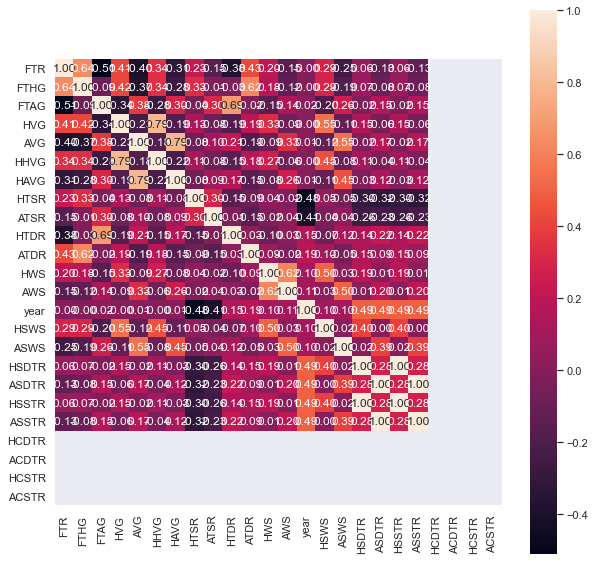

In [265]:
show_heatmap(team_history)

In [219]:
#hometeam_goal_total_count =data.groupby('HomeTeam').sum()['FTHG']
#hometeam_goal_total_count.sort_values(ascending=False).head(15)

In [220]:
'''
team_history_plus is team_history data plus the data such as Home Foul, Home Cornors...
As this data is quite sparse, I would suggest first use the team_history in traning, if good result is observed,
then we start to use the team_history_plus data
'''
team_history_plus = team_history.copy()
team_history_plus[['HF', 'AF', 'HC','AC','HY','AY','HR','AR']]= data[['HF', 'AF', 'HC','AC','HY','AY','HR','AR']].copy()
team_history_plus

,HomeTeam,AwayTeam,FTR,FTHG,FTAG,HVG,AVG,HHVG,HAVG,HTSR,...,HSSTR,ASSTR,HF,AF,HC,AC,HY,AY,HR,AR
Date,,,,,,,,,,,,,,,,,,,,,
2008-01-11,Chelsea,Sunderland,1,5,0,5.0,-5.0,3.0,-3.0,0.647059,...,0.000000,0.000000,5,11,4,0,0,1,0,0
2008-01-11,Everton,Fulham,1,1,0,1.0,-1.0,0.0,0.0,0.444444,...,0.000000,0.000000,11,15,6,5,0,0,0,0
2008-01-11,Man United,Hull,1,4,3,1.0,-1.0,2.0,-2.0,0.550000,...,0.428571,0.428571,12,13,9,1,2,2,0,0
2008-01-11,Middlesbrough,West Ham,0,1,1,0.0,0.0,-1.0,1.0,0.636364,...,0.125000,0.125000,10,14,5,4,3,4,0,0
2008-01-11,Portsmouth,Wigan,0,1,2,-1.0,1.0,-1.0,1.0,0.500000,...,0.250000,0.250000,9,11,9,6,0,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-01,Aston Villa,Man City,0,1,6,-11.0,23.0,-6.0,13.0,0.142857,...,1.250000,1.125000,5,12,2,4,2,1,0,0
2020-12-07,Aston Villa,Crystal Palace,1,2,0,-9.0,-8.0,-5.0,-6.0,0.750000,...,1.250000,1.250000,21,21,5,1,2,4,0,1
2020-12-07,Bournemouth,Leicester,1,4,1,-2.0,-3.0,-4.0,0.0,0.400000,...,1.628571,0.400000,11,12,2,6,2,1,0,1


In [221]:
'''
The prepared data for training. (Eliminate HomeTeam, AwayTeam in traning data though)

Annotation:
HVG/AVG: Home/Away team fulltime valid goals 
= home/away fulltime goal - away/home fulltime goal. Resets every 100 match

HHVG/HAVG: Home/Away team halftime valid goals 
= home/away halftime goal - away/home halftime goal. Resets every 100 match

HTSR/ATSR: Home/Away shots or target rate

HWS/AWS: Home/Away team winning score. 
Resets every 100 match. Calculated by the following rule:
    Win-2
    D-1
    Lose-0
'''
team_history

,HomeTeam,AwayTeam,FTR,FTHG,FTAG,HVG,AVG,HHVG,HAVG,HTSR,...,ATDR,HWS,AWS,year,HSWS,ASWS,HSDTR,ASDTR,HSSTR,ASSTR
Date,,,,,,,,,,,,,,,,,,,,,
2008-01-11,Chelsea,Sunderland,1,5,0,5.0,-5.0,3.0,-3.0,0.647059,...,0.454545,2.0,0.0,2008,30.0,16.0,0.000000,0.000000,0.000000,0.000000
2008-01-11,Everton,Fulham,1,1,0,1.0,-1.0,0.0,0.0,0.444444,...,0.250000,2.0,0.0,2008,23.0,20.0,0.000000,0.000000,0.000000,0.000000
2008-01-11,Man United,Hull,1,4,3,1.0,-1.0,2.0,-2.0,0.550000,...,0.363636,2.0,0.0,2008,27.0,20.0,0.428571,0.428571,0.428571,0.428571
2008-01-11,Middlesbrough,West Ham,0,1,1,0.0,0.0,-1.0,1.0,0.636364,...,0.142857,1.0,1.0,2008,15.0,18.0,0.125000,0.125000,0.125000,0.125000
2008-01-11,Portsmouth,Wigan,0,1,2,-1.0,1.0,-1.0,1.0,0.500000,...,0.125000,0.0,2.0,2008,17.0,20.0,0.250000,0.250000,0.250000,0.250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-01,Aston Villa,Man City,0,1,6,-11.0,23.0,-6.0,13.0,0.142857,...,1.000000,21.0,57.0,2020,23.0,57.0,1.250000,1.125000,1.250000,1.125000
2020-12-07,Aston Villa,Crystal Palace,1,2,0,-9.0,-8.0,-5.0,-6.0,0.750000,...,0.222222,23.0,30.0,2020,23.0,30.0,1.250000,1.250000,1.250000,1.250000
2020-12-07,Bournemouth,Leicester,1,4,1,-2.0,-3.0,-4.0,0.0,0.400000,...,1.000000,25.0,41.0,2020,25.0,41.0,1.628571,0.400000,1.628571,0.400000


### Train

#### Thoughts:
1. Use a sequence of past data to predict future data.
2. In epl-test, only team names are given, so we need to think about how to use the current data to train a prior model

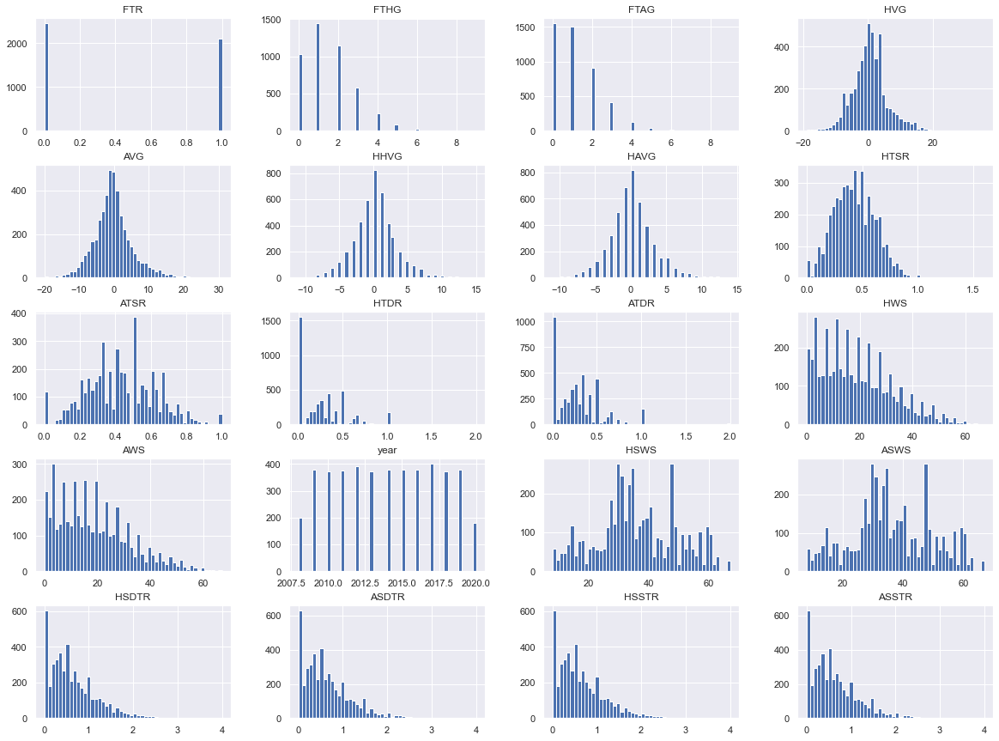

In [222]:
team_history.hist(bins = 50, figsize =(20,15))
plt.show()

array([[<AxesSubplot:xlabel='FTR', ylabel='FTR'>,
        <AxesSubplot:xlabel='ATSR', ylabel='FTR'>,
        <AxesSubplot:xlabel='ATDR', ylabel='FTR'>,
        <AxesSubplot:xlabel='ASWS', ylabel='FTR'>],
       [<AxesSubplot:xlabel='FTR', ylabel='ATSR'>,
        <AxesSubplot:xlabel='ATSR', ylabel='ATSR'>,
        <AxesSubplot:xlabel='ATDR', ylabel='ATSR'>,
        <AxesSubplot:xlabel='ASWS', ylabel='ATSR'>],
       [<AxesSubplot:xlabel='FTR', ylabel='ATDR'>,
        <AxesSubplot:xlabel='ATSR', ylabel='ATDR'>,
        <AxesSubplot:xlabel='ATDR', ylabel='ATDR'>,
        <AxesSubplot:xlabel='ASWS', ylabel='ATDR'>],
       [<AxesSubplot:xlabel='FTR', ylabel='ASWS'>,
        <AxesSubplot:xlabel='ATSR', ylabel='ASWS'>,
        <AxesSubplot:xlabel='ATDR', ylabel='ASWS'>,
        <AxesSubplot:xlabel='ASWS', ylabel='ASWS'>]], dtype=object)

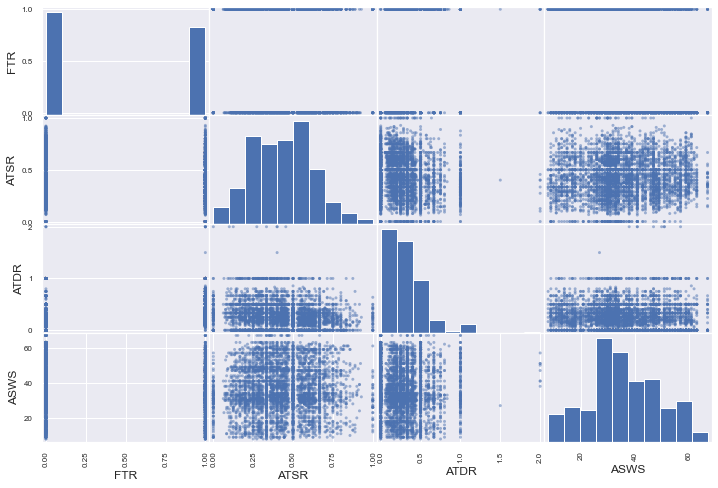

In [223]:

attributes = ['FTR','ATSR','ATDR','ASWS']
scatter_matrix(team_history[attributes],figsize=(12,8))

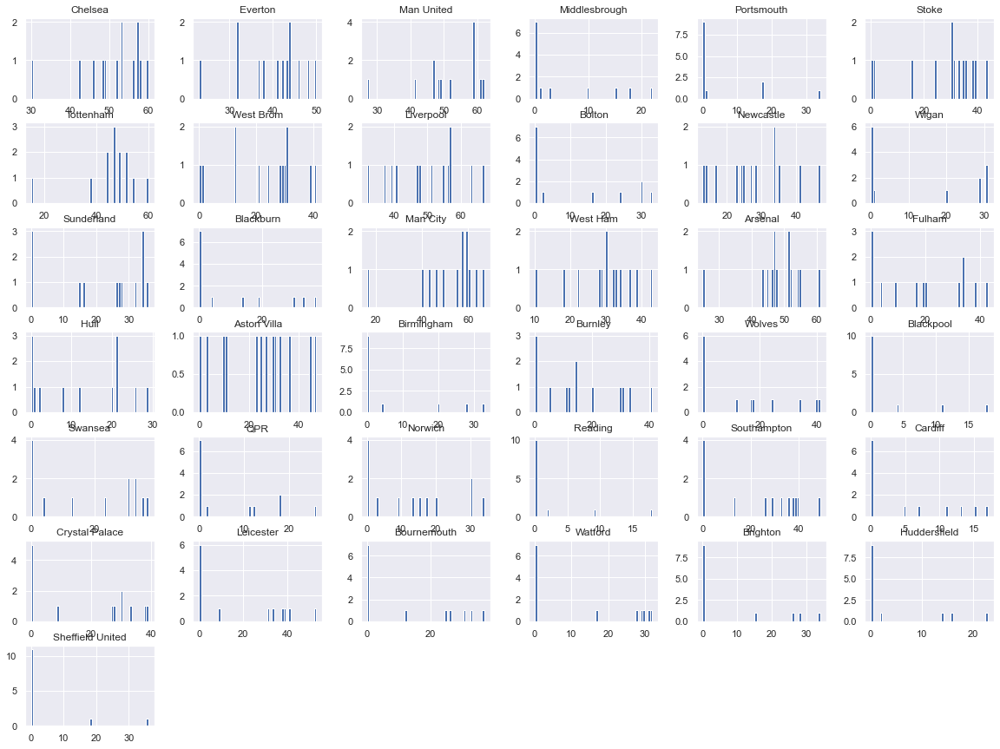

In [224]:
maximums.hist(bins = 50, figsize =(20,15))
plt.show()

In [409]:
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(team_history, test_size=0.05)

[bnlearn] >Bayesian DAG created.
[bnlearn] >Plot based on BayesianModel


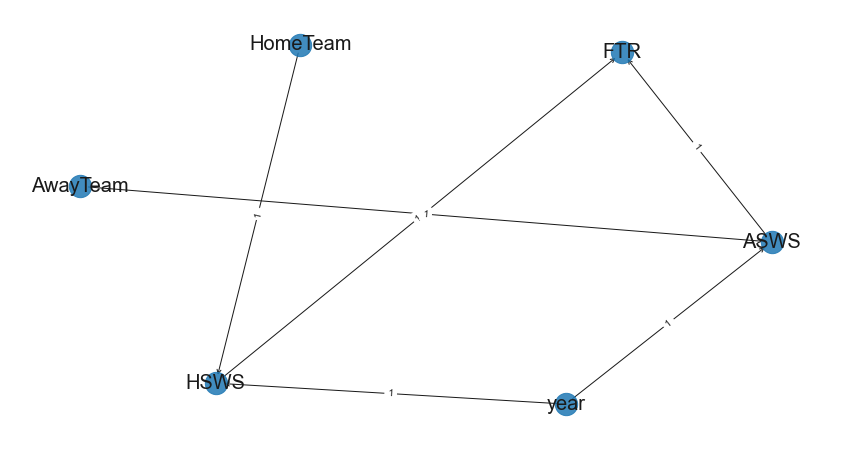

{'pos': {'year': array([ 0.40408803, -0.86051641]),
  'ASWS': array([ 0.99896641, -0.10798267]),
  'HSWS': array([-0.60746585, -0.76344851]),
  'HomeTeam': array([-0.36288796,  0.80837512]),
  'AwayTeam': array([-1.        ,  0.15075715]),
  'FTR': array([0.56729938, 0.77281531])},
 'G': <networkx.classes.digraph.DiGraph at 0x24ea0756520>}

In [410]:
import bnlearn as bn
# Define the network structure
edges = [('year', 'ASWS'),
         ('year', 'HSWS'),
         ('HomeTeam', 'HSWS'),
         ('AwayTeam', 'ASWS'),
         ('HSWS','FTR'),
         ('ASWS','FTR')]

# Make the actual Bayesian DAG
DAG = bn.make_DAG(edges)

bn.plot(DAG)

In [411]:
import bnlearn as bn
bndata = train_set [['year','ASWS', 'HSWS', 'FTR', 'HomeTeam', 'AwayTeam']]
# Learn parameters
DAG_update = bn.parameter_learning.fit(DAG, bndata)

-----+---------------------+---------------------+------------+------------+------------+---------------------+------------+---------------------+------------+---------------------+---------------------+---------------------+----------------------+--------------------+---------------------+------------+---------------------+---------------------+--------------------+--------------------+--------------------+----------------------+---------------------+------------+------------+---------------------+------------+---------------------+---------------------+------------+---------------------+------------+------------+---------------------+---------------------+------------+---------------------+------------+--------------------+------------+---------------------+---------------------+---------------------+---------------------+------------+------------+---------------------+---------------------+------------+------------+---------------------+------------+------------+--------------------

In [412]:
import bnlearn
# Make inference
q = bnlearn.inference.fit(DAG_update, variables=['FTR'], evidence={'HomeTeam': 'Fulham', 'AwayTeam': 'Chelsea' , 'year': 2009})

print (q.values)
print (q.values[1])
print(q.values[0])

[bnlearn] >Variable Elimination..
Eliminating: HSWS: 100%|██████████| 2/2 [00:00<00:00, 111.10it/s]+--------+------------+
| FTR    |   phi(FTR) |
+========+============+
| FTR(0) |     0.5006 |
+--------+------------+
| FTR(1) |     0.4994 |
+--------+------------+
[0.50062205 0.49937795]
0.499377951128241
0.500622048871759



Finding Elimination Order: : 100%|██████████| 2/2 [00:00<00:00, 22.98it/s]
[bnlearn] >Bayesian DAG created.
[bnlearn] >Plot based on BayesianModel


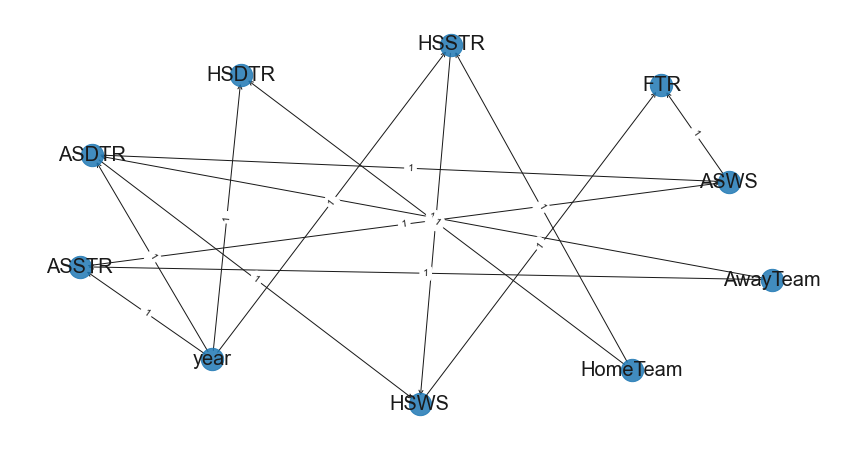

{'pos': {'year': array([-0.59577921, -0.75307673]),
  'ASSTR': array([-0.96051573, -0.24535951]),
  'ASDTR': array([-0.92632144,  0.37031765]),
  'HSDTR': array([-0.51639354,  0.80665189]),
  'HSSTR': array([0.06103772, 0.97528942]),
  'AwayTeam': array([ 0.94236906, -0.31665831]),
  'HomeTeam': array([ 0.55713338, -0.81150632]),
  'ASWS': array([0.82457473, 0.22139568]),
  'HSWS': array([-0.0254185, -1.       ]),
  'FTR': array([0.63931352, 0.75294624])},
 'G': <networkx.classes.digraph.DiGraph at 0x24e9b155880>}

In [413]:
import bnlearn as bn
# Define the network structure
edges2 = [('year', 'ASSTR'),
         ('year', 'ASDTR'),
         ('year', 'HSDTR'),
         ('year', 'HSSTR'),
         ('AwayTeam', 'ASSTR'),
         ('AwayTeam', 'ASDTR'),
         ('HomeTeam', 'HSDTR'),
         ('HomeTeam', 'HSSTR'),
         ('ASSTR','ASWS'),
         ('ASDTR','ASWS'),
         ('HSSTR','HSWS'),
         ('ASDTR','HSWS') ,       
         ('HSWS','FTR'),
         ('ASWS','FTR'),]

# Make the actual Bayesian DAG
DAG2 = bn.make_DAG(edges2)

bn.plot(DAG2)

In [414]:
import bnlearn as bn
bndata2 = train_set [['year','ASWS', 'HSWS', 'FTR', 'HomeTeam', 'AwayTeam', 'ASSTR', 'HSSTR','ASDTR', 'HSDTR']]
# Learn parameters
DAG_update2 = bn.parameter_learning.fit(DAG2, bndata2)

-----+---------------------+---------------------+------------+------------+------------+---------------------+------------+---------------------+------------+---------------------+---------------------+---------------------+----------------------+--------------------+---------------------+------------+---------------------+---------------------+--------------------+--------------------+--------------------+----------------------+---------------------+------------+------------+---------------------+------------+---------------------+---------------------+------------+---------------------+------------+------------+---------------------+---------------------+------------+---------------------+------------+--------------------+------------+---------------------+---------------------+---------------------+---------------------+------------+------------+---------------------+---------------------+------------+------------+---------------------+------------+------------+--------------------

In [416]:
import bnlearn
def get_prediction(df):
    for i in range(len(df)):
         q1 = bnlearn.inference.fit(DAG_update2, variables=['FTR'],evidence = {'year': df['year'].iloc[i], 'AwayTeam': df['AwayTeam'].iloc[i],'HomeTeam': df['HomeTeam'].iloc[i]})
         if q1.values[0] > q1.values[1] :
            test_set['prediction'].iloc[i] = 0
         else :
            test_set['prediction'].iloc[i] = 1

In [417]:
test_set['prediction']=np.nan

In [418]:
get_prediction(test_set)

13.34s/it] 
Eliminating: HSDTR: 100%|██████████| 6/6 [01:03<00:00, 10.56s/it]
+--------+------------+
| FTR    |   phi(FTR) |
+========+============+
| FTR(0) |     0.6134 |
+--------+------------+
| FTR(1) |     0.3866 |
+--------+------------+
[bnlearn] >Variable Elimination..
Finding Elimination Order: : 100%|██████████| 6/6 [00:52<00:00,  8.72s/it]

Eliminating: HSDTR: 100%|██████████| 6/6 [00:52<00:00,  8.82s/it]
+--------+------------+
| FTR    |   phi(FTR) |
+========+============+
| FTR(0) |     0.5537 |
+--------+------------+
| FTR(1) |     0.4463 |
+--------+------------+
[bnlearn] >Variable Elimination..
Finding Elimination Order: : 100%|██████████| 6/6 [01:01<00:00, 10.30s/it]

Eliminating: HSDTR: 100%|██████████| 6/6 [01:02<00:00, 10.39s/it]
+--------+------------+
| FTR    |   phi(FTR) |
+========+============+
| FTR(0) |     0.5090 |
+--------+------------+
| FTR(1) |     0.4910 |
+--------+------------+
[bnlearn] >Variable Elimination..
Finding Elimination Order: : 100

In [420]:
test_set


,HomeTeam,AwayTeam,FTR,FTHG,FTAG,HVG,AVG,HHVG,HAVG,HTSR,...,ASWS,HSDTR,ASDTR,HSSTR,ASSTR,HCDTR,ACDTR,HCSTR,ACSTR,prediction
Date,,,,,,,,,,,,,,,,,,,,,
2020-06-25,Chelsea,Man City,1,2,1,2.0,12.0,4.0,5.0,0.666667,...,57.0,0.634991,0.243350,0.634991,0.243350,NaN,NaN,NaN,NaN,0.0
2020-07-26,Crystal Palace,Tottenham,0,1,1,-4.0,5.0,-3.0,5.0,0.153846,...,44.0,0.781584,0.555735,0.781584,0.555735,NaN,NaN,NaN,NaN,0.0
2015-01-01,West Ham,West Brom,0,1,1,-1.0,-7.0,-3.0,-2.0,0.375000,...,28.0,0.543145,0.482970,0.543145,0.482970,NaN,NaN,NaN,NaN,0.0
2020-06-22,Man City,Burnley,1,5,0,13.0,2.0,6.0,-2.0,0.368421,...,41.0,0.243350,0.611142,0.243350,0.611142,NaN,NaN,NaN,NaN,0.0
2018-12-22,Man City,Crystal Palace,0,2,3,17.0,1.0,8.0,4.0,0.263158,...,33.0,0.793756,0.618119,0.793756,0.618119,NaN,NaN,NaN,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-03-03,Liverpool,Arsenal,0,1,2,-4.0,1.0,-2.0,0.0,0.333333,...,45.0,0.312126,0.472974,0.312126,0.472974,NaN,NaN,NaN,NaN,0.0
2015-04-04,Swansea,Hull,1,3,1,5.0,-6.0,2.0,-2.0,0.444444,...,21.0,0.608203,0.207920,0.608203,0.207920,NaN,NaN,NaN,NaN,1.0
2017-09-16,Huddersfield,Leicester,0,1,1,3.0,1.0,2.0,-1.0,0.200000,...,38.0,0.247520,0.662049,0.247520,0.662049,NaN,NaN,NaN,NaN,0.0


In [422]:
def get_error(df):
    for i in range(len(df)):
        if df['prediction'].iloc[i] == df['FTR'].iloc[i]:
            df['error'].iloc[i]=0
        else: df['error'].iloc[i]=1


In [429]:
test_set['error']=np.nan
get_error(test_set)
accuracy = (len(test_set) - test_set['error'].sum())/len(test_set)
print(accuracy)

0.6140350877192983
